### DATA ANALYSIS

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
df = pd.read_csv(r'C:/Users/giihv/Documents/Project Group/bank-additional-full.csv', sep=';')
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


In [3]:
df_sample = df.sample(5)
df_sample

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
36336,27,student,single,basic.9y,no,yes,yes,cellular,jun,tue,...,1,999,0,nonexistent,-2.9,92.963,-40.8,1.262,5076.2,yes
32358,29,blue-collar,married,basic.9y,no,yes,no,cellular,may,fri,...,1,999,0,nonexistent,-1.8,92.893,-46.2,1.313,5099.1,no
3488,58,retired,married,basic.6y,unknown,no,no,telephone,may,thu,...,2,999,0,nonexistent,1.1,93.994,-36.4,4.860,5191.0,no
13507,34,blue-collar,married,basic.9y,no,yes,yes,cellular,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.963,5228.1,no
13078,35,services,single,high.school,no,no,no,cellular,jul,tue,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no


In [4]:
pd.set_option('display.max_columns', None)
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [5]:
df.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

There's no NaN values

In [6]:
df['pdays'].value_counts()

999    39673
3        439
6        412
4        118
9         64
2         61
7         60
12        58
10        52
5         46
13        36
11        28
1         26
15        24
14        20
8         18
0         15
16        11
17         8
18         7
22         3
19         3
21         2
25         1
26         1
27         1
20         1
Name: pdays, dtype: int64

pdays = number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)

Almost all of the 'pdays' values are 999

(999  =  39673)

In [7]:
df['previous'].value_counts()

0    35563
1     4561
2      754
3      216
4       70
5       18
6        5
7        1
Name: previous, dtype: int64

In [8]:
df.loc[(df['pdays']==999) & (df['previous']>= 1), :]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
24013,38,blue-collar,single,unknown,no,yes,no,telephone,oct,tue,39,1,999,1,failure,-0.1,93.798,-40.4,4.968,5195.8,no
24019,40,services,married,high.school,no,yes,no,telephone,oct,tue,144,1,999,1,failure,-0.1,93.798,-40.4,4.968,5195.8,yes
24076,36,admin.,married,university.degree,no,yes,no,telephone,nov,wed,449,1,999,1,failure,-0.1,93.200,-42.0,4.663,5195.8,no
24102,36,admin.,married,high.school,no,yes,no,telephone,nov,wed,114,1,999,1,failure,-0.1,93.200,-42.0,4.286,5195.8,yes
24113,29,self-employed,married,university.degree,no,yes,no,telephone,nov,thu,86,1,999,1,failure,-0.1,93.200,-42.0,4.245,5195.8,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41166,32,admin.,married,university.degree,no,no,no,telephone,nov,wed,651,1,999,1,failure,-1.1,94.767,-50.8,1.030,4963.6,yes
41170,40,management,divorced,university.degree,no,yes,no,cellular,nov,wed,293,2,999,4,failure,-1.1,94.767,-50.8,1.030,4963.6,no
41173,62,retired,married,university.degree,no,yes,no,cellular,nov,thu,329,1,999,2,failure,-1.1,94.767,-50.8,1.031,4963.6,yes
41175,34,student,single,unknown,no,yes,no,cellular,nov,thu,180,1,999,2,failure,-1.1,94.767,-50.8,1.031,4963.6,no


There are some rows that 'pdays' == 999 (not previously contacted) and at the same time 'previous' >= 1 (number of contacts performed before this campaign and for this client)
What is weird, 'previous' was supposed to be == 0, or 'pdays' != 999

In [9]:
df['poutcome'].value_counts()

nonexistent    35563
failure         4252
success         1373
Name: poutcome, dtype: int64

We have 41188 rows, more than 85% of the values of there columns are the same. We need to check if it's worth it using these columns or not!

In [10]:
df['y'].value_counts()

no     36548
yes     4640
Name: y, dtype: int64

Even though more than 85% of this column has the value "no", we cannot drop it. Because it's the most important for our model prediction

Has the client subscribed a term deposit? (binary: 'yes','no')

In [11]:
df.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                  object
dtype: object

The value types seem to be correct

In [12]:
df['default'].value_counts()

no         32588
unknown     8597
yes            3
Name: default, dtype: int64

In [13]:
df['housing'].value_counts()

yes        21576
no         18622
unknown      990
Name: housing, dtype: int64

In [14]:
df['loan'].value_counts()

no         33950
yes         6248
unknown      990
Name: loan, dtype: int64

In [15]:
df['education'].value_counts()

university.degree      12168
high.school             9515
basic.9y                6045
professional.course     5243
basic.4y                4176
basic.6y                2292
unknown                 1731
illiterate                18
Name: education, dtype: int64

There are some columns with the value == unknown in 'education', 'loan', 'housing' and 'default'

In [16]:
df['month'].value_counts()

may    13769
jul     7174
aug     6178
jun     5318
nov     4101
apr     2632
oct      718
sep      570
mar      546
dec      182
Name: month, dtype: int64

There are no "January" or "February" in the "month" column of the data set

### DATA TREATMENT

#### Data Values

pdays = number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)

Almost all of the 'pdays' values are 999

This column will be dropped

In [17]:
df = df.drop('pdays', axis=1)
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,334,1,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,383,1,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,189,2,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,442,1,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


Almost all of the values in the column 'poutcome' = 'nonexistent' and it's also going to be dropped

In [18]:
df = df.drop('poutcome', axis=1)
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,0,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,0,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,0,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,0,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,0,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,334,1,0,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,383,1,0,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,189,2,0,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,442,1,0,-1.1,94.767,-50.8,1.028,4963.6,yes


In [19]:
df['job'].value_counts()

admin.           10422
blue-collar       9254
technician        6743
services          3969
management        2924
retired           1720
entrepreneur      1456
self-employed     1421
housemaid         1060
unemployed        1014
student            875
unknown            330
Name: job, dtype: int64

There are some unknown values in the job column, they will be treated later

In [20]:
df['marital'].value_counts()

married     24928
single      11568
divorced     4612
unknown        80
Name: marital, dtype: int64

Since there are only 71 rows in 40858 in marital == unknown, they are going to be dropped

In [21]:
df = df.drop((df.loc[df['marital'] == 'unknown', :]).index, axis=0)
df = df.reset_index(drop=True)
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,0,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,0,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,0,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,0,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,0,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41103,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,334,1,0,-1.1,94.767,-50.8,1.028,4963.6,yes
41104,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,383,1,0,-1.1,94.767,-50.8,1.028,4963.6,no
41105,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,189,2,0,-1.1,94.767,-50.8,1.028,4963.6,no
41106,44,technician,married,professional.course,no,no,no,cellular,nov,fri,442,1,0,-1.1,94.767,-50.8,1.028,4963.6,yes


In [22]:
df['education'].value_counts()

university.degree      12137
high.school             9501
basic.9y                6037
professional.course     5237
basic.4y                4170
basic.6y                2286
unknown                 1722
illiterate                18
Name: education, dtype: int64

But in education, there are more than 1500 rows == unknown, they will be treated later

In [23]:
print(df['default'].value_counts())
print(df.loc[(df['default']=='unknown'), 'y'].value_counts())
print(df.loc[(df['default']=='yes'), 'y'].value_counts())
print(df.loc[(df['default']=='no'), 'y'].value_counts()) 

no         32519
unknown     8586
yes            3
Name: default, dtype: int64
no     8143
yes     443
Name: y, dtype: int64
no    3
Name: y, dtype: int64
no     28334
yes     4185
Name: y, dtype: int64


There are only 3 rows in 'default' == 'yes' and in all of them 'y' == 'no' and if we were to replace 'unknown' values, probably most or all of them would be == 'no'. This feature will be removed, instead of treated, since is not so useful for the model.

In [24]:
df = df.drop('default', axis=1)
df.shape

(41108, 18)

In [25]:
print(df['housing'].value_counts())
print(df.loc[(df['housing']=='unknown'), 'y'].value_counts())
print(df.loc[(df['housing']=='yes'), 'y'].value_counts())
print(df.loc[(df['housing']=='no'), 'y'].value_counts()) 

yes        21541
no         18578
unknown      989
Name: housing, dtype: int64
no     882
yes    107
Name: y, dtype: int64
no     19039
yes     2502
Name: y, dtype: int64
no     16559
yes     2019
Name: y, dtype: int64


In [26]:
print(df['loan'].value_counts())
print(df.loc[(df['loan']=='unknown'), 'y'].value_counts())
print(df.loc[(df['loan']=='yes'), 'y'].value_counts())
print(df.loc[(df['loan']=='no'), 'y'].value_counts()) 

no         33883
yes         6236
unknown      989
Name: loan, dtype: int64
no     882
yes    107
Name: y, dtype: int64
no     5554
yes     682
Name: y, dtype: int64
no     30044
yes     3839
Name: y, dtype: int64


In [27]:
print(df.loc[(df['loan']=='unknown'), 'housing'].value_counts()) 

unknown    989
Name: housing, dtype: int64


The rows where df['loan']=='unknown' are the same where df['housing']=='unknown', 989 items that will be replaced with the mode value of each column. What seems more reasonable to do and it won't compromise our dataframe.
Most of the missing values in 'y' == 'no', and also in the mode value of the columns as well.

In [28]:
mode_h = df['housing'].mode()
mode_l = df['loan'].mode()
print('The mode value of housing column is '+ mode_h)
print('The mode value of loan column is '+ mode_l)

0    The mode value of housing column is yes
Name: housing, dtype: object
0    The mode value of loan column is no
Name: loan, dtype: object


In [29]:
df.loc[(df['housing']=='unknown'), 'housing'] = 'yes'
print(df['housing'].value_counts())

yes    22530
no     18578
Name: housing, dtype: int64


In [30]:
df.loc[(df['loan']=='unknown'), 'loan'] = 'no'
print(df['loan'].value_counts())

no     34872
yes     6236
Name: loan, dtype: int64


#### Outliers

###### First we will see numeric outliers, and then we'll check other features

In [31]:
def limits(column):
    q1 = column.quantile(0.25)
    q3 = column.quantile(0.75)
    amp = q3 - q1
    
    return q1 - 1.5*amp, q3 + 1.5 * amp

def delete_outliers(df, column):
    number_rows = df.shape[0]
    min_limit, max_limit = limits(df[column])
    df = df.loc[(df[column] >= min_limit) & (df[column] <= max_limit), :]
    removed_rows = number_rows - df.shape[0]
    
    return df, removed_rows

def get_median(df, column):
    min_limit, max_limit = limits(df[column])
    median = df[column].median()
    try:
        df.loc[(df[column] <= min_limit), column] = median
    except:
        pass
    
    try:
        df.loc[(df[column] >= max_limit), column] = median
    except:
        pass
    
    return df

def fill_f(df, column):
    min_limit, max_limit = limits(df[column])
    
    try:
        df.loc[(df[column] <= min_limit), column] = np.nan
    except:
        pass
    
    try:
        df.loc[(df[column] >= max_limit), column] = np.nan
    except:
        pass
        
    return df.ffill(axis=0, inplace=True)

In [32]:
def box_d(column):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    
    fig.set_size_inches(15, 5)
    
    sns.boxplot(x=column, ax = ax1)
    ax2.set_xlim(limits(column))
    sns.boxplot(x=column, ax = ax2)
    
def histogram(column):
    plt.figure(figsize=(15, 5))
    sns.histplot(column, kde=True)
    
def bar_graph(column):
    plt.figure(figsize=(15, 5))
    ax = sns.barplot(x=column.value_counts().index, y=column.value_counts())
    ax.set_xlim(limits(column))

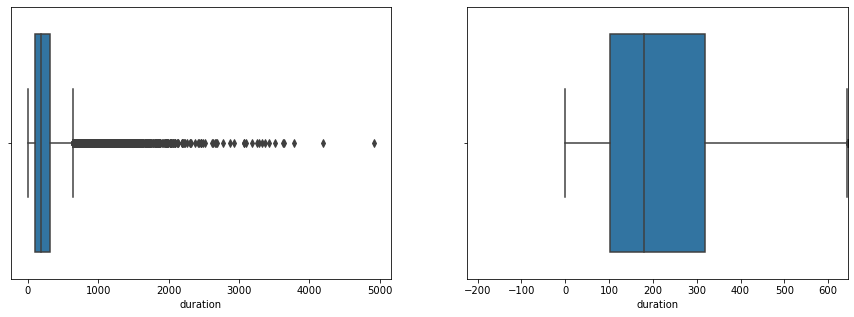

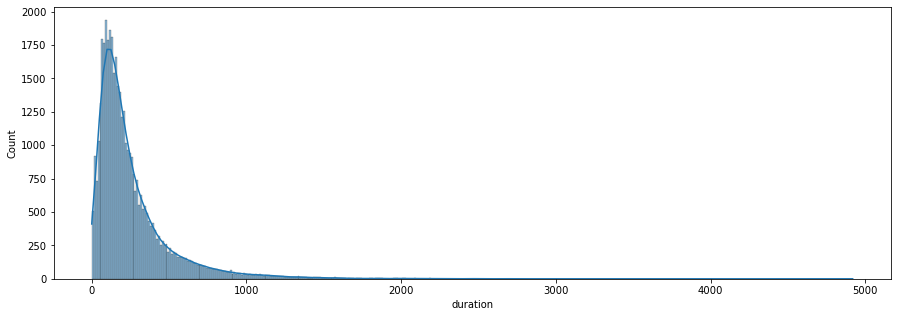

In [33]:
box_d(df["duration"])
histogram(df["duration"])

Since there are many outliers in this column, instead of deleting them, we are going to replace them with back/forward values

In [34]:
fill_f(df, 'duration')

(41108, 18)

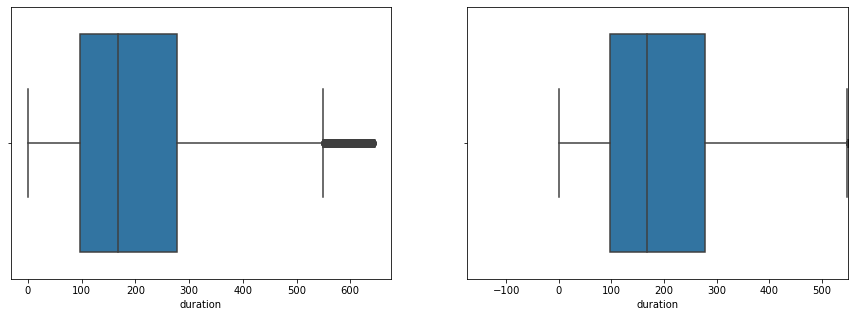

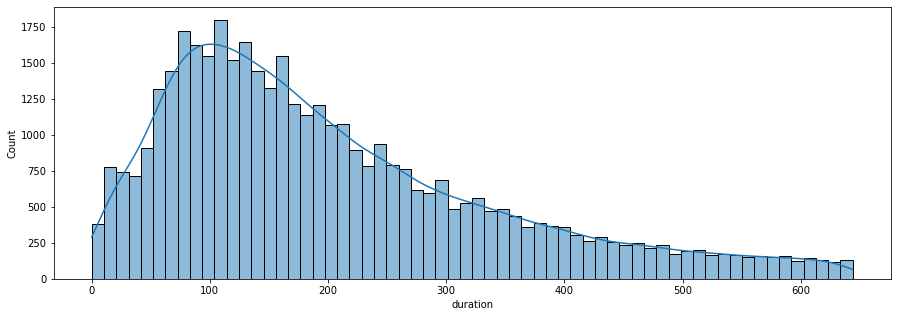

In [35]:
box_d(df["duration"])
histogram(df["duration"])
display(df.shape)

In [36]:
df['duration'].value_counts()

136.0    185
104.0    181
73.0     181
85.0     180
87.0     179
        ... 
621.0      6
3.0        4
0.0        4
1.0        4
2.0        1
Name: duration, Length: 645, dtype: int64

In [37]:
df.isnull().sum()

age               0
job               0
marital           0
education         0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
previous          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

C:\Users\giihv\AppData\Local\Temp\ipykernel_22032\3814508941.py:7: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax2.set_xlim(limits(column))


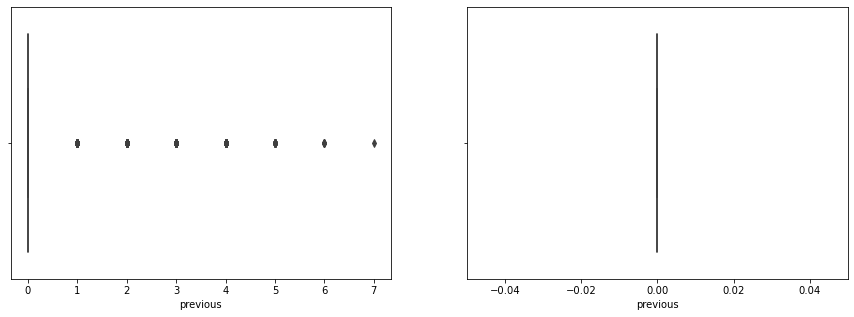

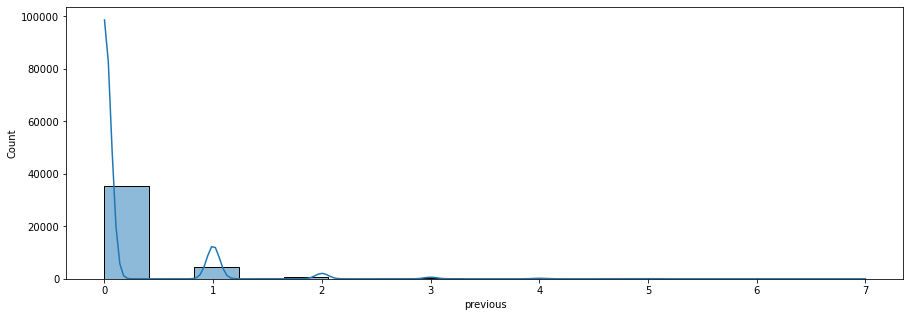

In [38]:
box_d(df["previous"])
histogram(df["previous"])

In [39]:
df['previous'].value_counts()

0    35501
1     4547
2      750
3      216
4       70
5       18
6        5
7        1
Name: previous, dtype: int64

For the rows that previous >= 4, we are going to drop them

In [40]:
numbers = [4, 5, 6, 7]
for i in numbers:
    df = df.drop(df.loc[df['previous'] == i, :].index, axis=0)
    
display(df.shape)
display(df['previous'].value_counts())

(41014, 18)

0    35501
1     4547
2      750
3      216
Name: previous, dtype: int64

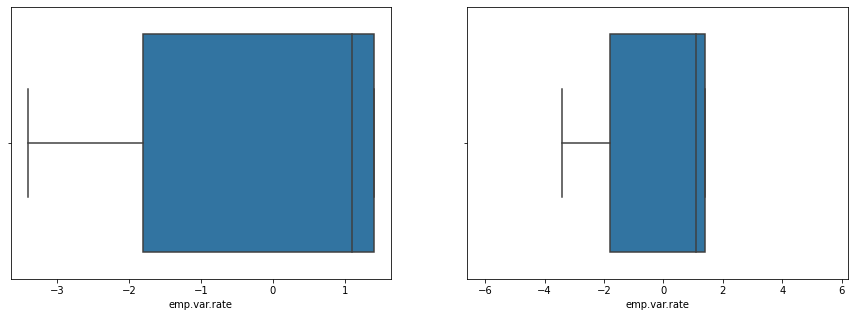

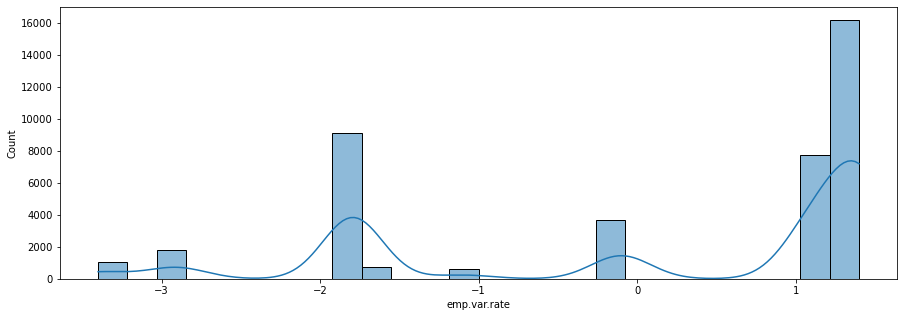

In [41]:
box_d(df["emp.var.rate"])
histogram(df["emp.var.rate"])

In [42]:
df['emp.var.rate'].value_counts()

 1.4    16209
-1.8     9138
 1.1     7748
-0.1     3676
-2.9     1654
-3.4     1068
-1.7      744
-1.1      595
-3.0      172
-0.2       10
Name: emp.var.rate, dtype: int64

The values are balanced

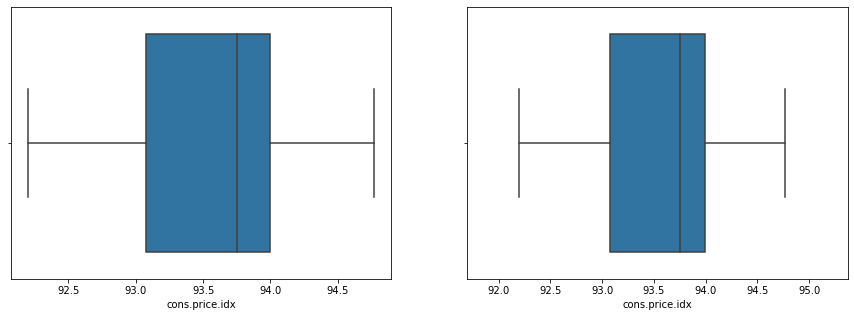

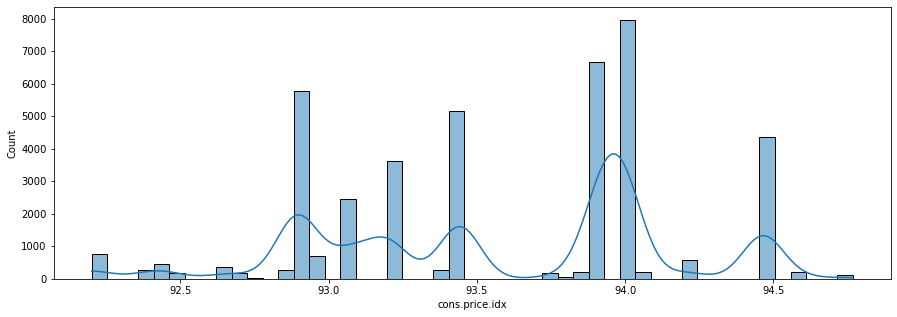

In [43]:
box_d(df["cons.price.idx"])
histogram(df["cons.price.idx"])

In [44]:
df['cons.price.idx'].value_counts()

93.994    7748
93.918    6676
92.893    5776
93.444    5168
94.465    4365
93.200    3609
93.075    2455
92.201     765
92.963     711
92.431     445
92.649     356
94.215     309
94.199     284
92.843     281
92.379     267
93.369     258
94.055     220
94.027     215
94.601     197
93.876     196
92.469     178
92.713     172
93.749     172
94.767     114
93.798      67
92.756      10
Name: cons.price.idx, dtype: int64

No outliers

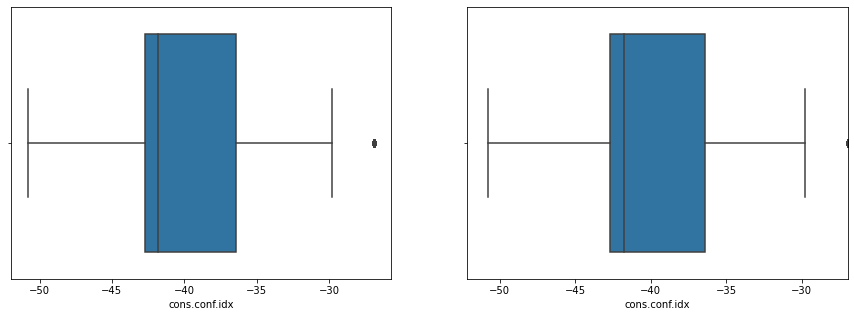

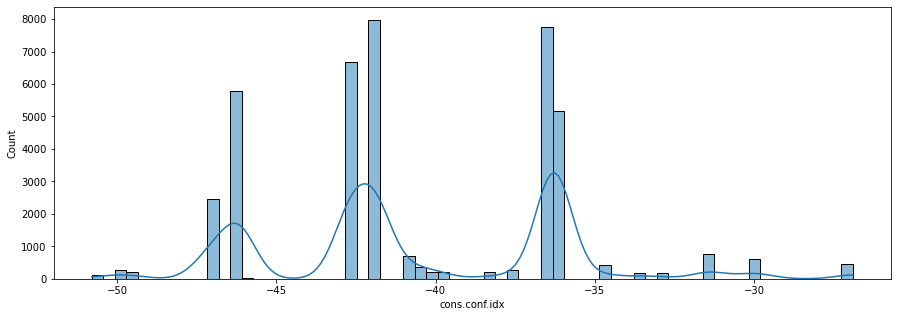

In [45]:
box_d(df["cons.conf.idx"])
histogram(df["cons.conf.idx"])

In [46]:
df['cons.conf.idx'].value_counts()

-36.4    7748
-42.7    6676
-46.2    5776
-36.1    5168
-41.8    4365
-42.0    3609
-47.1    2455
-31.4     765
-40.8     711
-26.9     445
-30.1     356
-40.3     309
-37.5     284
-50.0     281
-29.8     267
-34.8     258
-39.8     220
-38.3     215
-49.5     197
-40.0     196
-33.6     178
-33.0     172
-34.6     172
-50.8     114
-40.4      67
-45.9      10
Name: cons.conf.idx, dtype: int64

Number of rows deleted: 445
(40569, 18)


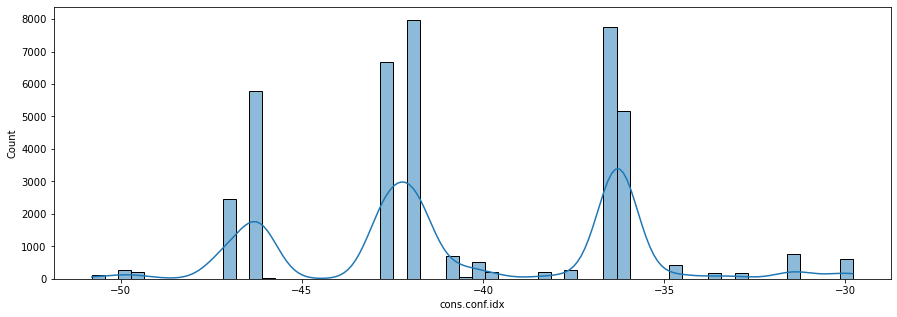

In [47]:
df, removed_rows = delete_outliers(df, 'cons.conf.idx')
print(f"Number of rows deleted: {removed_rows}")
histogram(df['cons.conf.idx'])
print(df.shape)

There weren't many outliers, compared to the shape of the dataframe, so we preferred to drop them

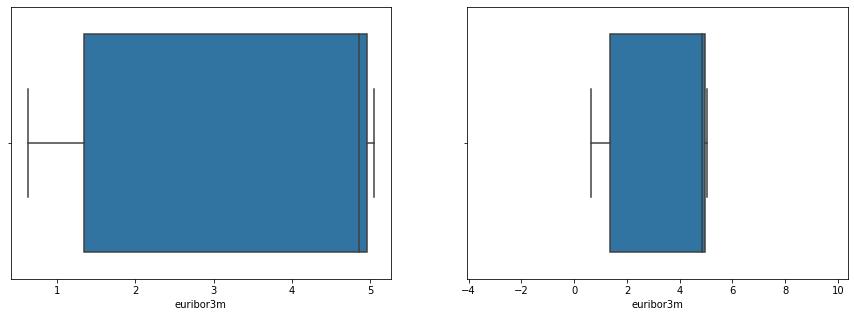

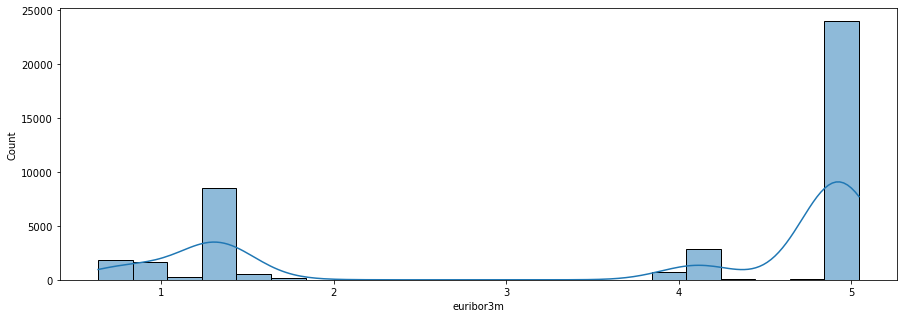

In [48]:
box_d(df["euribor3m"])
histogram(df["euribor3m"])

No outliers

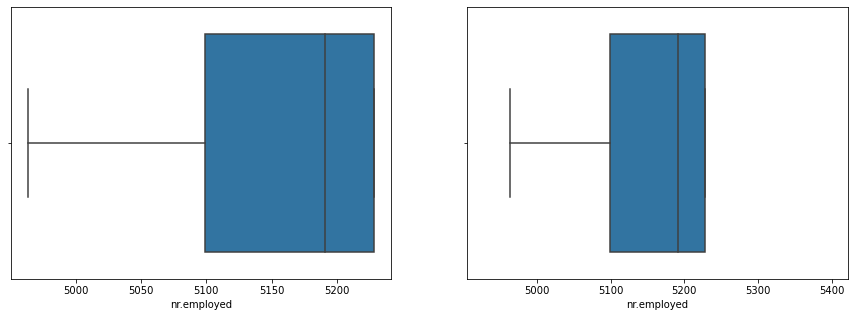

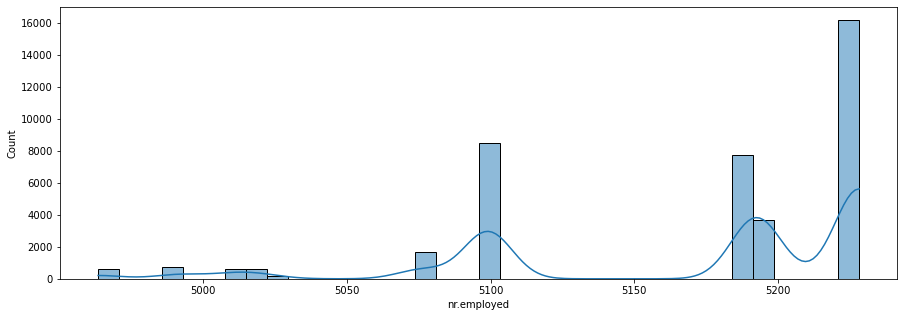

In [49]:
box_d(df["nr.employed"])
histogram(df["nr.employed"])

0 outliers in this one

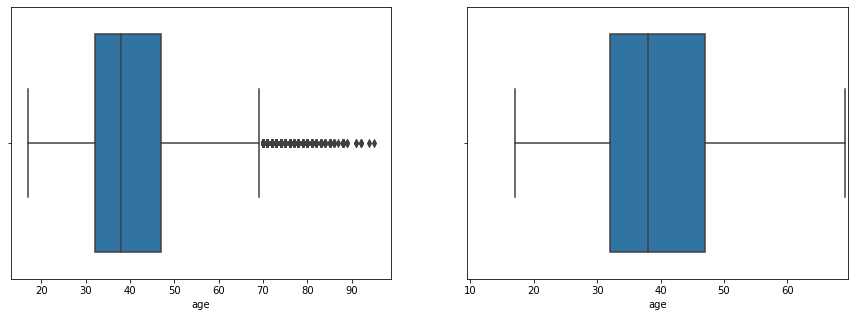

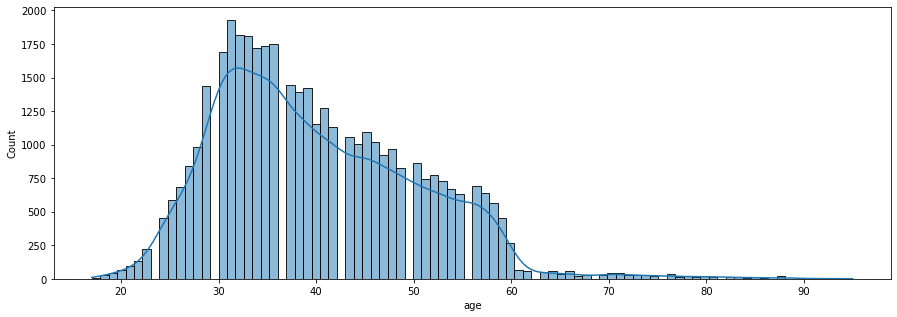

In [50]:
box_d(df["age"])
histogram(df["age"])

In [51]:
df['age'].value_counts()

31    1929
32    1818
33    1807
36    1752
35    1738
      ... 
89       2
91       2
94       1
87       1
95       1
Name: age, Length: 77, dtype: int64

Number of rows deleted: 404
(40165, 18)


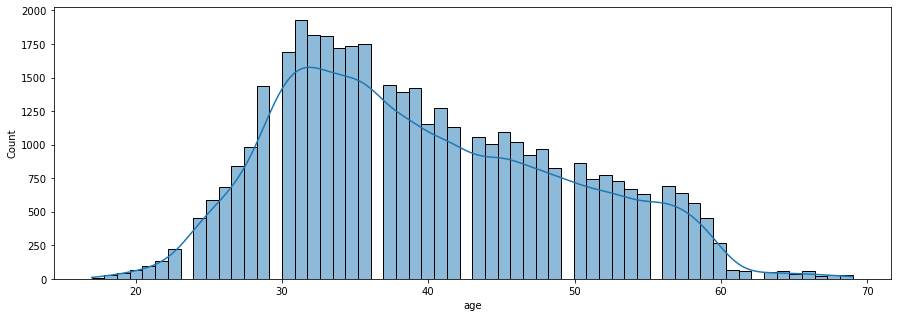

In [66]:
df, removed_rows = delete_outliers(df, 'age')
print(f"Number of rows deleted: {removed_rows}")
histogram(df['age'])
print(df.shape)

In [67]:
df = df.reset_index(drop=True)
df

,age,job,marital,education,housing,loan,contact,month,day_of_week,duration,campaign,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,telephone,may,mon,261.0,1,0,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,no,no,telephone,may,mon,149.0,1,0,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,yes,no,telephone,may,mon,226.0,1,0,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,telephone,may,mon,151.0,1,0,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,yes,telephone,may,mon,307.0,1,0,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40160,37,admin.,married,university.degree,yes,no,cellular,nov,fri,281.0,1,0,-1.1,94.767,-50.8,1.028,4963.6,yes
40161,29,unemployed,single,basic.4y,yes,no,cellular,nov,fri,112.0,1,1,-1.1,94.767,-50.8,1.028,4963.6,no
40162,46,blue-collar,married,professional.course,no,no,cellular,nov,fri,383.0,1,0,-1.1,94.767,-50.8,1.028,4963.6,no
40163,56,retired,married,university.degree,yes,no,cellular,nov,fri,189.0,2,0,-1.1,94.767,-50.8,1.028,4963.6,no


###### Now we will check text features

C:\Users\giihv\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


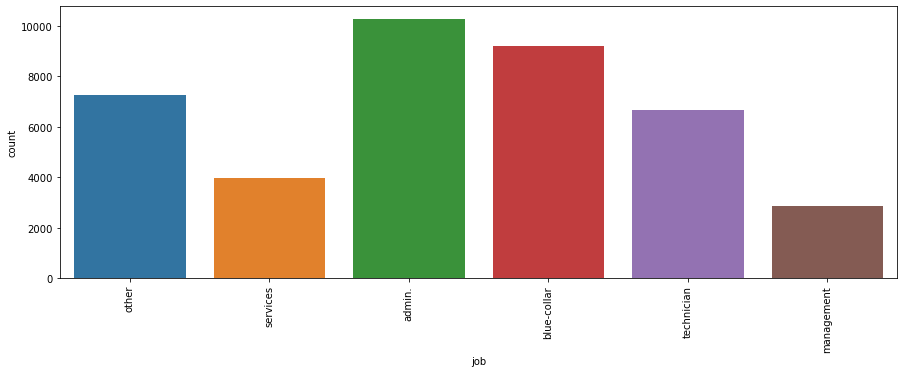

In [68]:
job = df['job'].value_counts()

group_columns = []
for value in job.index:
    if job[value] < 2000:
        group_columns.append(value)

for value in group_columns:
    df.loc[df['job']==value, 'job'] = 'other'
    
plt.figure(figsize=(15,5))
graphic = sns.countplot('job', data=df)
graphic.tick_params(axis='x', rotation=90)

C:\Users\giihv\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


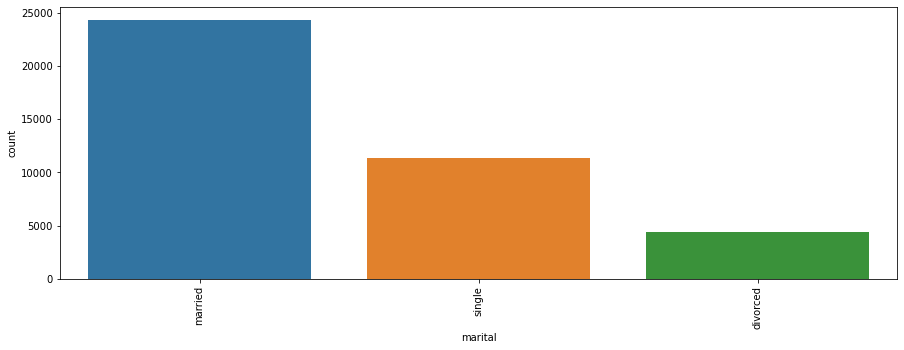

In [69]:
plt.figure(figsize=(15,5))
graphic = sns.countplot('marital', data=df)
graphic.tick_params(axis='x', rotation=90)

C:\Users\giihv\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


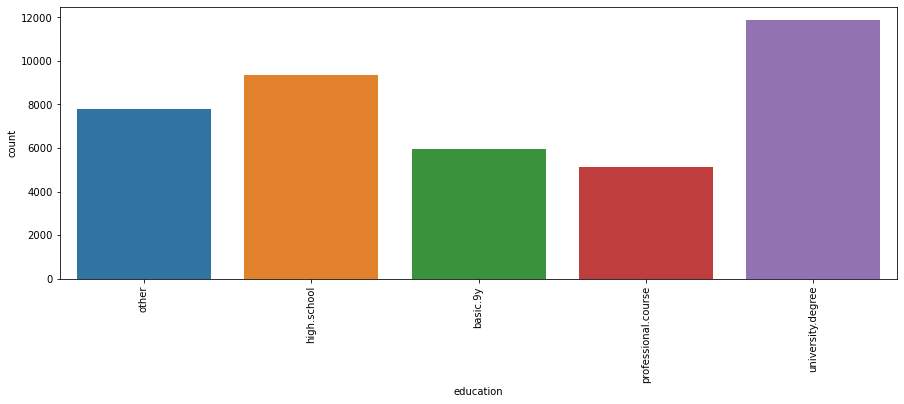

In [70]:
education = df['education'].value_counts()

group_columns = []
for value in education.index:
    if education[value] < 4000:
        group_columns.append(value)

for value in group_columns:
    df.loc[df['education']==value, 'education'] = 'other'
    
plt.figure(figsize=(15,5))
graphic = sns.countplot('education', data=df)
graphic.tick_params(axis='x', rotation=90)

C:\Users\giihv\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


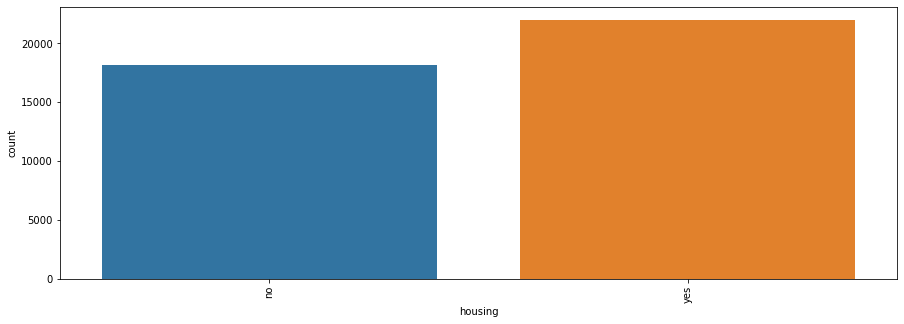

In [71]:
plt.figure(figsize=(15,5))
graphic = sns.countplot('housing', data=df)
graphic.tick_params(axis='x', rotation=90)

C:\Users\giihv\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


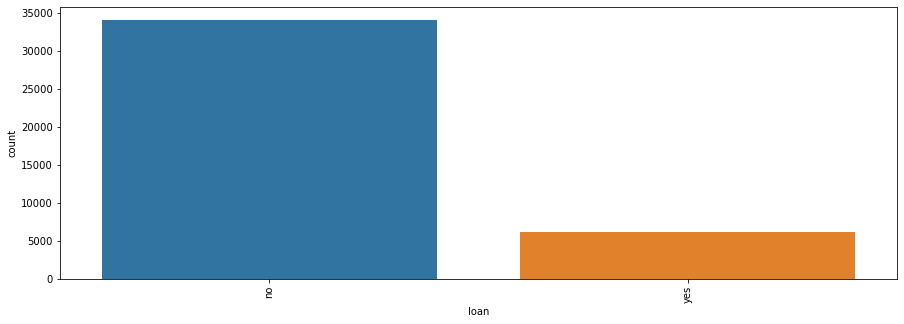

In [72]:
plt.figure(figsize=(15,5))
graphic = sns.countplot('loan', data=df)
graphic.tick_params(axis='x', rotation=90)

C:\Users\giihv\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


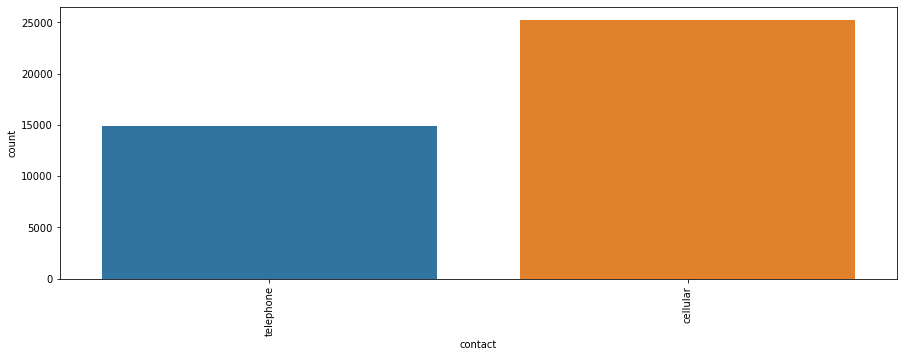

In [73]:
plt.figure(figsize=(15,5))
graphic = sns.countplot('contact', data=df)
graphic.tick_params(axis='x', rotation=90)

C:\Users\giihv\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


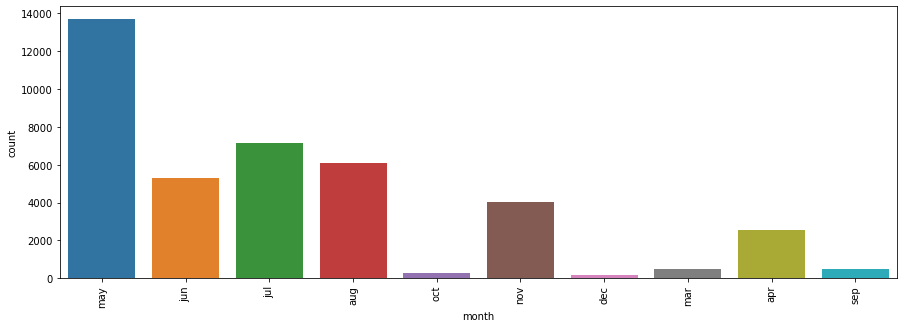

In [74]:
plt.figure(figsize=(15,5))
graphic = sns.countplot('month', data=df)
graphic.tick_params(axis='x', rotation=90)

We can see that there's no 'jan' or 'feb' but it's not a problem

C:\Users\giihv\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


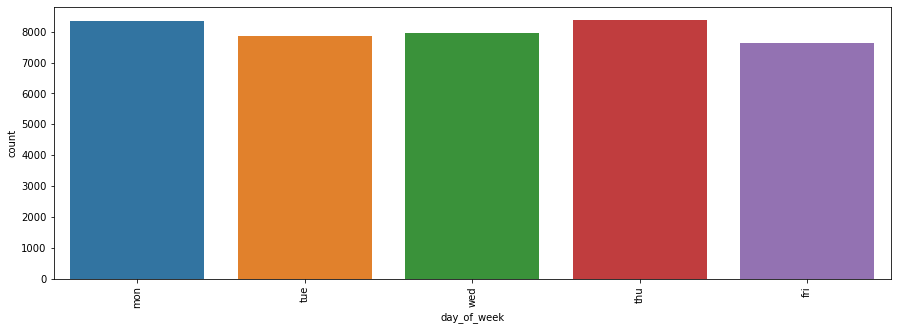

In [75]:
plt.figure(figsize=(15,5))
graphic = sns.countplot('day_of_week', data=df)
graphic.tick_params(axis='x', rotation=90)

These values are all well balanced, it might not be so important for our machine learning model but we are keeping them for now

### Final Dataframe

In [76]:
new_df = df.copy()
new_df.to_csv("treated_bank_df.csv", sep=';', index=False)

In [77]:
treated_df = pd.read_csv('treated_bank_df.csv', sep=';')
treated_df

,age,job,marital,education,housing,loan,contact,month,day_of_week,duration,campaign,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,other,married,other,no,no,telephone,may,mon,261.0,1,0,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,no,no,telephone,may,mon,149.0,1,0,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,yes,no,telephone,may,mon,226.0,1,0,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,other,no,no,telephone,may,mon,151.0,1,0,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,yes,telephone,may,mon,307.0,1,0,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40160,37,admin.,married,university.degree,yes,no,cellular,nov,fri,281.0,1,0,-1.1,94.767,-50.8,1.028,4963.6,yes
40161,29,other,single,other,yes,no,cellular,nov,fri,112.0,1,1,-1.1,94.767,-50.8,1.028,4963.6,no
40162,46,blue-collar,married,professional.course,no,no,cellular,nov,fri,383.0,1,0,-1.1,94.767,-50.8,1.028,4963.6,no
40163,56,other,married,university.degree,yes,no,cellular,nov,fri,189.0,2,0,-1.1,94.767,-50.8,1.028,4963.6,no


In [78]:
treated_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40165 entries, 0 to 40164
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             40165 non-null  int64  
 1   job             40165 non-null  object 
 2   marital         40165 non-null  object 
 3   education       40165 non-null  object 
 4   housing         40165 non-null  object 
 5   loan            40165 non-null  object 
 6   contact         40165 non-null  object 
 7   month           40165 non-null  object 
 8   day_of_week     40165 non-null  object 
 9   duration        40165 non-null  float64
 10  campaign        40165 non-null  int64  
 11  previous        40165 non-null  int64  
 12  emp.var.rate    40165 non-null  float64
 13  cons.price.idx  40165 non-null  float64
 14  cons.conf.idx   40165 non-null  float64
 15  euribor3m       40165 non-null  float64
 16  nr.employed     40165 non-null  float64
 17  y               40165 non-null 

In [79]:
print(treated_df['marital'].value_counts())
print('')
print(treated_df['education'].value_counts())
print('')
print(treated_df['previous'].value_counts())
print('')
print(treated_df['housing'].value_counts())
print('')
print(treated_df['loan'].value_counts())

married     24338
single      11383
divorced     4444
Name: marital, dtype: int64

university.degree      11895
high.school             9362
other                   7810
basic.9y                5975
professional.course     5123
Name: education, dtype: int64

0    34998
1     4310
2      663
3      194
Name: previous, dtype: int64

yes    21995
no     18170
Name: housing, dtype: int64

no     34057
yes     6108
Name: loan, dtype: int64


Now we can see that the new df we created is fully cleaned

### Final Analysis of EDA

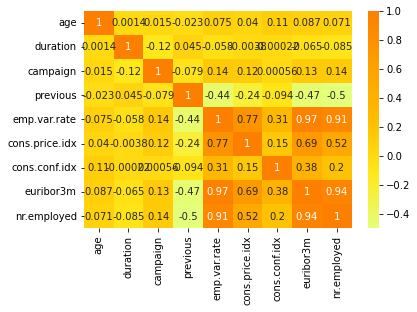

In [80]:
sns.heatmap(treated_df.corr(), cmap ='Wistia', annot=True)
plt.show()

In [83]:
import plotly.express as px

def column_category_graphic(column, spreadsheet):
    fig = px.histogram(spreadsheet, x=column, color='y')
    color_discrete_sequence=['#e6ad12', '#02b013']
    fig.show()

for column in treated_df:
    column_category_graphic(column, treated_df)

When we take a look at these graphics, even though most of the people say no, we still can find some patterns

- In the heatmap we can see that the columns 'euribor3m', 'nr.employed' and 'emp.var.rate' are highly correlated.
- In the education column we can see that most people who has subscribed have a university degree.
- Most of them did not have a personal loan.
- The contact by phone seems to be more effective, what makes sense because it's easier to convince someone of something when you talk personally to them.
- The last contact month of year was way bigger in may.
- Most of the numbers of contacts performed during the campaign and for the client were only once or twice.
- And in the last graphic, as we can see, only 11,7% of the people has subscribed to a a term deposit.